# Pruebas Preprocesamiento Imágenes. - V2

Realizaremos pruebas concretas para entender la función rotate y algunas transformaciones de volumentations.

## Librerías

In [1]:
# Tratamiento datos
import pandas as pd
import numpy as np
from collections import Counter
import time

# Organizar rutas imágenes
import os
import random

# Lectura tomografías.
import nibabel as nib # Lectura
from scipy import ndimage # Tratamiento

# Modelado
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Data Augmentation
from volumentations import *

# Visualización CTs
import matplotlib.pyplot as plt
import re

import itertools
from functools import partial

pd.set_option('display.max_columns', 500)
pd.set_option('display.float_format', lambda x: f'{x:.3f}')
#pd.set_option('display.float_format', lambda x: f'{x:,.3f}') #add a comma separator between the thousands.
pd.set_option('display.max_colwidth',1000)



np.set_printoptions(threshold=1000, linewidth = 300, edgeitems = 5)
np.set_printoptions(suppress=True)


import pickle

## Pruebas

### 1. Rotación Spicy

In [2]:
from scipy import misc

In [3]:
array_test = np.array([[[1, 2, 3, 4], [5, 6, 7, 8], [9, 10, 11, 12]],
                    [[13, 14, 15, 16], [17, 18, 19, 20], [21, 22, 23, 24]]])
print(array_test.shape)
array_test

(2, 3, 4)


array([[[ 1,  2,  3,  4],
        [ 5,  6,  7,  8],
        [ 9, 10, 11, 12]],

       [[13, 14, 15, 16],
        [17, 18, 19, 20],
        [21, 22, 23, 24]]])

In [4]:
ndimage.rotate(array_test, 90, reshape=False)

array([[[ 0,  0,  0,  0],
        [14, 15, 16, 17],
        [ 0,  0,  0,  0]],

       [[ 0,  0,  0,  0],
        [ 8,  9, 10, 11],
        [ 0,  0,  0,  0]]])

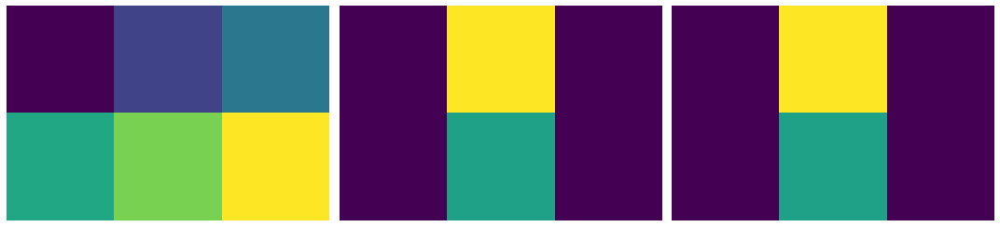

In [5]:
img = array_test[:,:,0]
img_90 = ndimage.rotate(img, 90, reshape=False)
img_90_2 = ndimage.rotate(img, 90, reshape=False, axes=(0,1))

fig = plt.figure(figsize=(15, 15))
ax1, ax2, ax3 = fig.subplots(1, 3)

ax1.imshow(img)
ax1.set_axis_off()
ax2.imshow(img_90)
ax2.set_axis_off()
ax3.imshow(img_90_2)
ax3.set_axis_off()
fig.set_tight_layout(True)
plt.show()

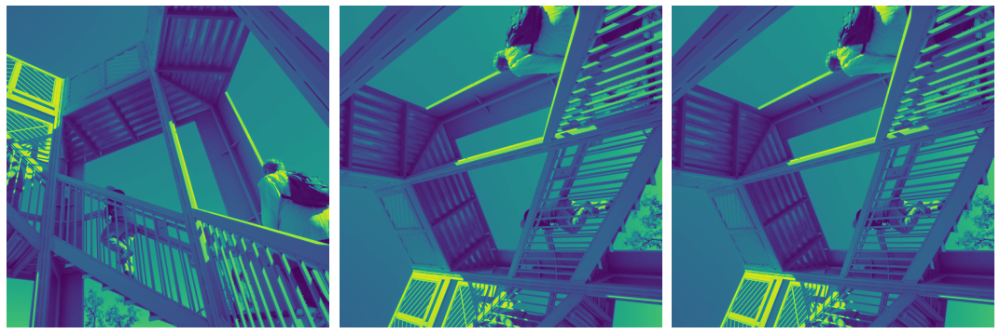

In [6]:
img = misc.ascent()
img_90 = ndimage.rotate(img, 90, reshape=False)
img_90_2 = ndimage.rotate(img, 90, reshape=False, axes=(0,1))

# Rotación en el plano X-Y o viceversa: https://stackoverflow.com/questions/12113869/axes-parameter-in-scipy-ndimage-interpolation-rotate

fig = plt.figure(figsize=(15, 15))
ax1, ax2, ax3 = fig.subplots(1, 3)

ax1.imshow(img)
ax1.set_axis_off()
ax2.imshow(img_90)
ax2.set_axis_off()
ax3.imshow(img_90_2)
ax3.set_axis_off()
fig.set_tight_layout(True)
plt.show()

### 2. Volumentations

In [7]:
min_ventana = -1000
max_ventana = 0

In [8]:
def read_nifti_file(filepath):
    """Read and load volume"""
    # Read file
    scan = nib.load(filepath)
    # Get raw data
    scan = scan.get_fdata()
    return scan


def normalize(volume, min_normalize, max_normalize):
    """Normalize the volume"""
    min = min_normalize #-1000
    max = max_normalize #400
    volume[volume < min] = min
    volume[volume > max] = max
    volume = (volume - min) / (max - min)
    volume = volume.astype("float32")
    return volume


def resize_volume(img):
    """Resize across z-axis"""
    # Set the desired depth
    desired_depth = 64
    desired_width = 128
    desired_height = 128
    # Get current depth
    current_depth = img.shape[-1]
    current_width = img.shape[0]
    current_height = img.shape[1]
    # Compute depth factor
    depth = current_depth / desired_depth
    width = current_width / desired_width
    height = current_height / desired_height
    depth_factor = 1 / depth
    width_factor = 1 / width
    height_factor = 1 / height
    # Resize across z-axis
    img = ndimage.zoom(img, (width_factor, height_factor, depth_factor), order=1)
    # Rotate
    img = ndimage.rotate(img, 90, reshape=False)
    return img


def process_scan(path, min_normalize, max_normalize):
    """Read and resize volume"""
    # Read scan
    volume = read_nifti_file(path)
    # Normalize
    volume = normalize(volume, min_normalize=min_normalize, max_normalize=max_normalize)
    # Resize width, height and depth
    volume = resize_volume(volume)
    return volume


In [9]:
train_df = pd.read_csv(r'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Path_Sets/train_df.csv')
test_df = pd.read_csv(r'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Path_Sets/test_df.csv')
valid_df = pd.read_csv(r'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Path_Sets/valid_df.csv')

train_df['set'] = 'Entrenamiento'
test_df['set'] = 'Test'
valid_df['set'] = 'Validacion'

dfs = pd.concat([train_df,test_df,valid_df])
dfs

,File_Path,File_Path_Google,Label,set
0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0053.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0053.nii.gz,0,Entrenamiento
1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0195.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0195.nii.gz,0,Entrenamiento
2,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0010.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0010.nii.gz,0,Entrenamiento
3,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0009.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0009.nii.gz,0,Entrenamiento
4,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0050.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0050.nii.gz,0,Entrenamiento
...,...,...,...,...
40,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1080.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1080.nii.gz,1,Validacion
41,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1077.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1077.nii.gz,1,Validacion
42,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1081.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1081.nii.gz,1,Validacion
43,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1090.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1090.nii.gz,1,Validacion


In [10]:
archivo = dfs.sample(n=1, random_state=9411).reset_index(drop = True)
archivo

,File_Path,File_Path_Google,Label,set
0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-2/study_0969.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-2/study_0969.nii.gz,1,Test


In [11]:
archivo.loc[0,'File_Path']

'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-2/study_0969.nii.gz'

In [12]:
imagen = process_scan(archivo.loc[0,'File_Path'], min_normalize = min_ventana, max_normalize = max_ventana)
imagen.shape

(128, 128, 64)

#### 2.1 Rotación

In [13]:
def get_augmentation(patch_size):
    return Compose([
        #Resize(patch_size, interpolation=1, resize_type=0, always_apply=True, p=1.0),
        Rotate((-15, 15), (0, 0), (0, 0), p=1),
        #Flip(0, p=1), # Eje X
        #Flip(1, p=1), # Eje Y
        #Flip(2, p=1), # Eje Z
        #GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        #ColorJitter(brightness=(1,3),contrast=(0.4,0.8),saturation=0,hue=0, p=1),
    ], p=1)

def augmentor(img):
    aug = get_augmentation((128,128,64))
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    return np.ndarray.astype(img , np.float32)



Pre Shape: (128, 128, 64)
Post Shape: (128, 128, 64)
Label: 1
---- Orignal
Min: -2.0478394e-16
Max: 1.0
Mean: 0.5099596
Sum: 534731.4
---- Aumentada
Min: -7.633747e-17
Max: 1.0
Mean: 0.4927962
Sum: 516734.28
------------------------------------------- Cambió: True


Text(0.5, 1.0, 'Después')

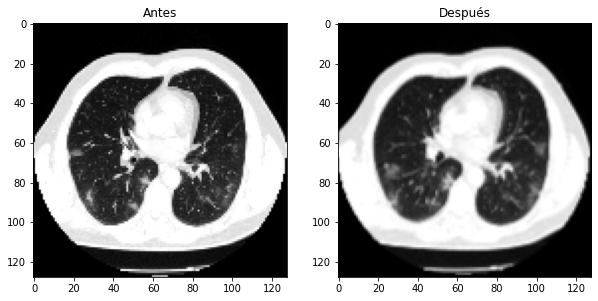

In [14]:
imagen_pre_aug = imagen
label = archivo.loc[0,'Label']
img_aug = augmentor(imagen_pre_aug)

print("Pre Shape:",imagen_pre_aug.shape)
print("Post Shape:",img_aug.shape)
print("Label:",label)

print("---- Orignal")
print("Min:", imagen_pre_aug.min())
print("Max:", imagen_pre_aug.max())
print("Mean:", imagen_pre_aug.mean())
print("Sum:", imagen_pre_aug.sum())

print("---- Aumentada")
print("Min:", img_aug.min())
print("Max:", img_aug.max())
print("Mean:", img_aug.mean())
print("Sum:", img_aug.sum())

print(f"------------------------------------------- Cambió: {imagen_pre_aug.sum() != img_aug.sum()}")

# Ploteamos un slice antes y después
fig = plt.figure(figsize=(10, 10))
rows = 1
columns = 2

slice = 35
fig.add_subplot(rows, columns, 1)
plt.imshow(np.squeeze(imagen_pre_aug[:, :, slice]), cmap="gray")
plt.title("Antes")

fig.add_subplot(rows, columns, 2)
plt.imshow(np.squeeze(img_aug[:, :, slice]), cmap="gray")
plt.title("Después")

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_Rotate_ORI_study_0969_Label_1_Rango-1000_0.png


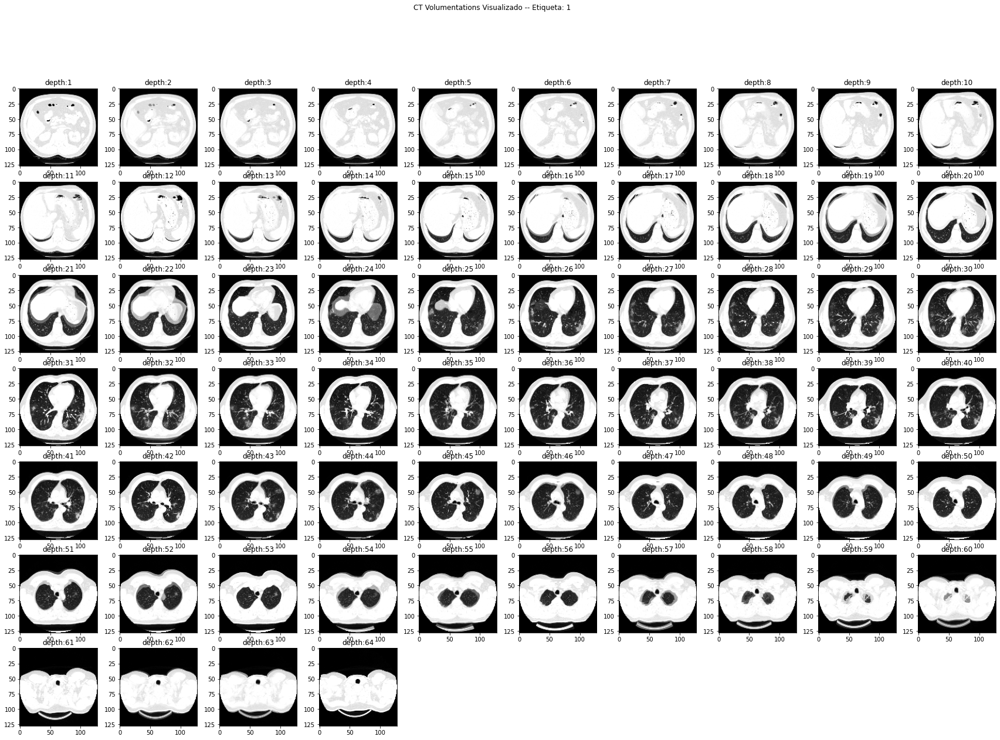

In [15]:
# Tomamos la imagen original
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)

img_print = imagen_pre_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
#img_print = img_test
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "Rotate_ORI"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_Rotate_AUG_study_0969_Label_1_Rango-1000_0.png


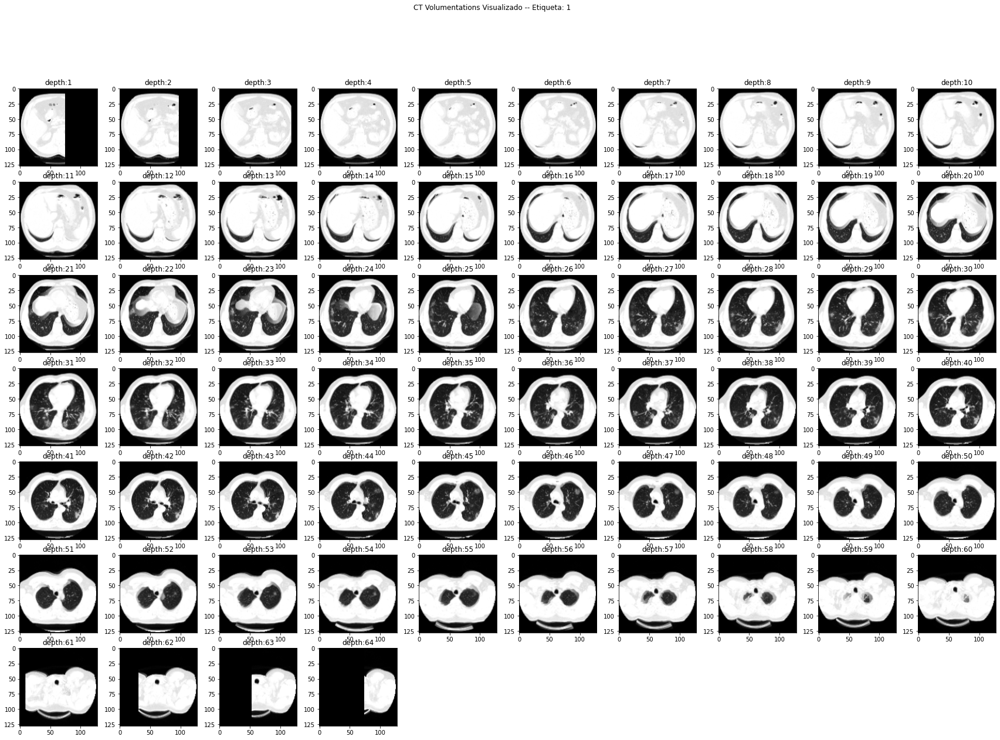

In [16]:
# Tomamos la imagen augmented 
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)
img_print = img_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "Rotate_AUG"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

#### 2.2 Flip X

In [17]:
def get_augmentation(patch_size):
    return Compose([
        #Resize(patch_size, interpolation=1, resize_type=0, always_apply=True, p=1.0),
        # Rotate((-15, 15), (0, 0), (0, 0), p=1),
        Flip(0, p=1), # Eje X
        #Flip(1, p=1), # Eje Y
        #Flip(2, p=1), # Eje Z
        #GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        #ColorJitter(brightness=(1,3),contrast=(0.4,0.8),saturation=0,hue=0, p=1),
    ], p=1)

def augmentor(img):
    aug = get_augmentation((128,128,64))
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    return np.ndarray.astype(img , np.float32)



Pre Shape: (128, 128, 64)
Post Shape: (128, 128, 64)
Label: 1
---- Orignal
Min: -2.0478394e-16
Max: 1.0
Mean: 0.5099596
Sum: 534731.4
---- Aumentada
Min: -2.0478394e-16
Max: 1.0
Mean: 0.50995934
Sum: 534731.1
------------------------------------------- Cambió: True


Text(0.5, 1.0, 'Después')

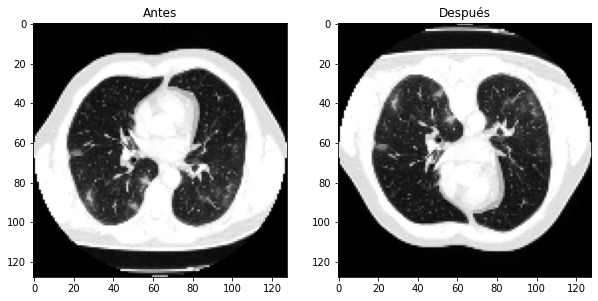

In [18]:
imagen_pre_aug = imagen
label = archivo.loc[0,'Label']
img_aug = augmentor(imagen_pre_aug)

print("Pre Shape:",imagen_pre_aug.shape)
print("Post Shape:",img_aug.shape)
print("Label:",label)

print("---- Orignal")
print("Min:", imagen_pre_aug.min())
print("Max:", imagen_pre_aug.max())
print("Mean:", imagen_pre_aug.mean())
print("Sum:", imagen_pre_aug.sum())

print("---- Aumentada")
print("Min:", img_aug.min())
print("Max:", img_aug.max())
print("Mean:", img_aug.mean())
print("Sum:", img_aug.sum())

print(f"------------------------------------------- Cambió: {imagen_pre_aug.sum() != img_aug.sum()}")

# Ploteamos un slice antes y después
fig = plt.figure(figsize=(10, 10))
rows = 1
columns = 2

slice = 35
fig.add_subplot(rows, columns, 1)
plt.imshow(np.squeeze(imagen_pre_aug[:, :, slice]), cmap="gray")
plt.title("Antes")

fig.add_subplot(rows, columns, 2)
plt.imshow(np.squeeze(img_aug[:, :, slice]), cmap="gray")
plt.title("Después")

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_FlipX_ORI_study_0969_Label_1_Rango-1000_0.png


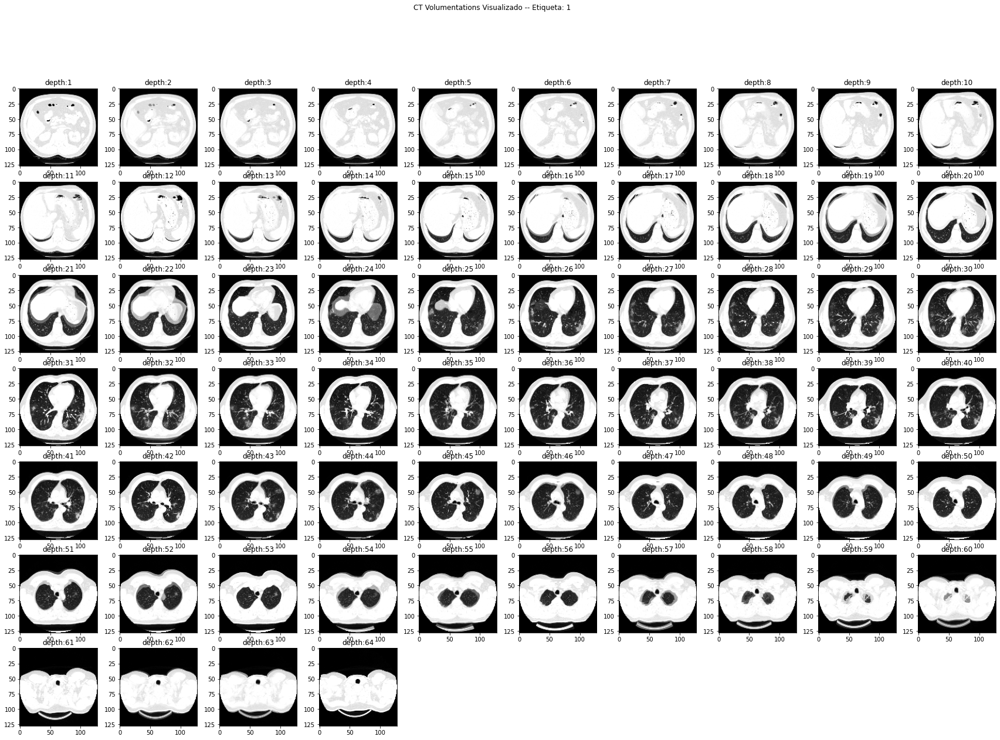

In [19]:
# Tomamos la imagen original
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)

img_print = imagen_pre_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
#img_print = img_test
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "FlipX_ORI"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_FlipX_AUG_study_0969_Label_1_Rango-1000_0.png


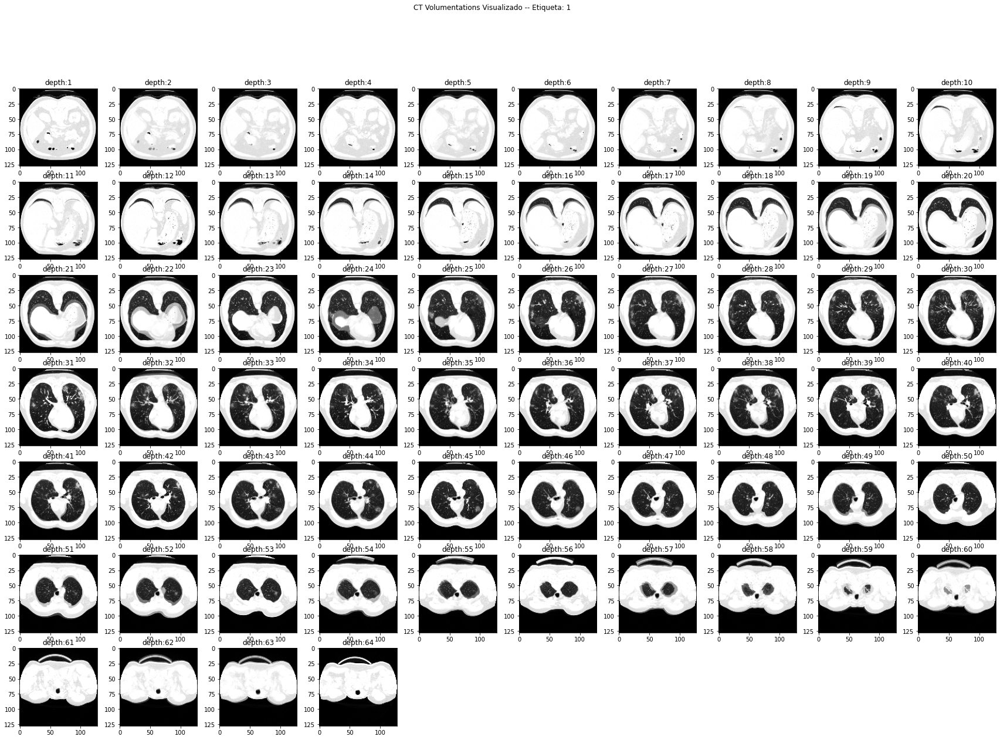

In [20]:
# Tomamos la imagen augmented 
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)
img_print = img_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "FlipX_AUG"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

#### 2.3 Flip Y

In [21]:
def get_augmentation(patch_size):
    return Compose([
        #Resize(patch_size, interpolation=1, resize_type=0, always_apply=True, p=1.0),
        # Rotate((-15, 15), (0, 0), (0, 0), p=1),
        #Flip(0, p=1), # Eje X
        Flip(1, p=1), # Eje Y
        #Flip(2, p=1), # Eje Z
        #GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        #ColorJitter(brightness=(1,3),contrast=(0.4,0.8),saturation=0,hue=0, p=1),
    ], p=1)

def augmentor(img):
    aug = get_augmentation((128,128,64))
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    return np.ndarray.astype(img , np.float32)



Pre Shape: (128, 128, 64)
Post Shape: (128, 128, 64)
Label: 1
---- Orignal
Min: -2.0478394e-16
Max: 1.0
Mean: 0.5099596
Sum: 534731.4
---- Aumentada
Min: -2.0478394e-16
Max: 1.0
Mean: 0.5099596
Sum: 534731.4
------------------------------------------- Cambió: False


Text(0.5, 1.0, 'Después')

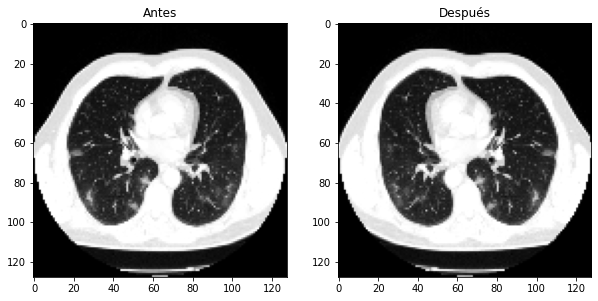

In [22]:
imagen_pre_aug = imagen
label = archivo.loc[0,'Label']
img_aug = augmentor(imagen_pre_aug)

print("Pre Shape:",imagen_pre_aug.shape)
print("Post Shape:",img_aug.shape)
print("Label:",label)

print("---- Orignal")
print("Min:", imagen_pre_aug.min())
print("Max:", imagen_pre_aug.max())
print("Mean:", imagen_pre_aug.mean())
print("Sum:", imagen_pre_aug.sum())

print("---- Aumentada")
print("Min:", img_aug.min())
print("Max:", img_aug.max())
print("Mean:", img_aug.mean())
print("Sum:", img_aug.sum())

print(f"------------------------------------------- Cambió: {imagen_pre_aug.sum() != img_aug.sum()}")

# Ploteamos un slice antes y después
fig = plt.figure(figsize=(10, 10))
rows = 1
columns = 2

slice = 35
fig.add_subplot(rows, columns, 1)
plt.imshow(np.squeeze(imagen_pre_aug[:, :, slice]), cmap="gray")
plt.title("Antes")

fig.add_subplot(rows, columns, 2)
plt.imshow(np.squeeze(img_aug[:, :, slice]), cmap="gray")
plt.title("Después")

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_FlipY_ORI_study_0969_Label_1_Rango-1000_0.png


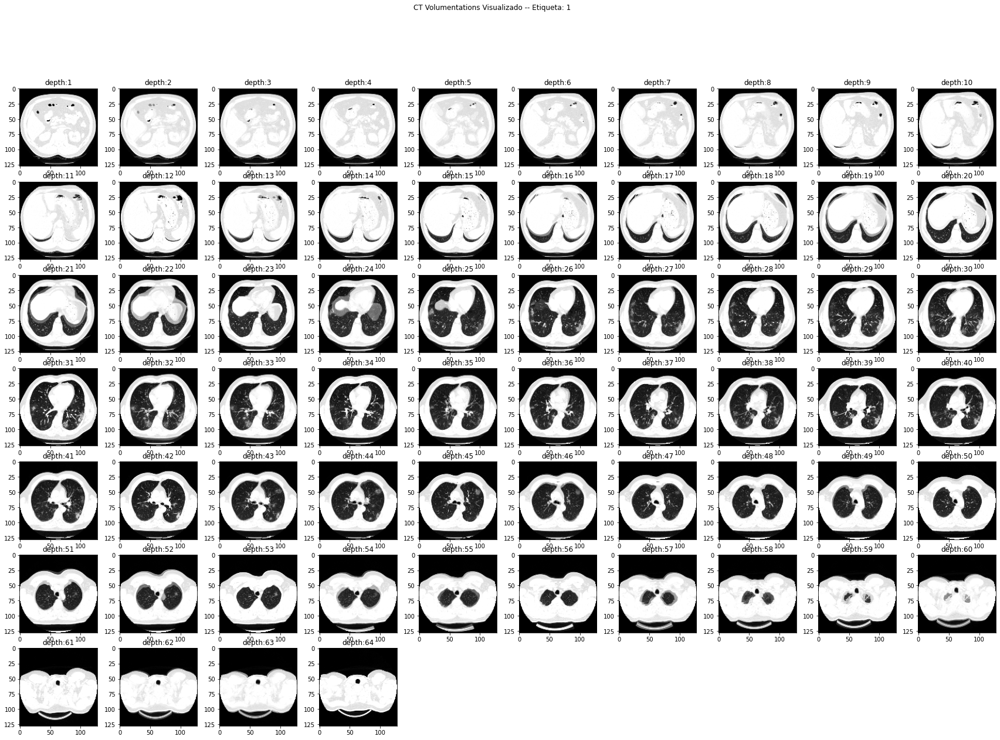

In [23]:
# Tomamos la imagen original
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)

img_print = imagen_pre_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
#img_print = img_test
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "FlipY_ORI"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_FlipY_AUG_study_0969_Label_1_Rango-1000_0.png


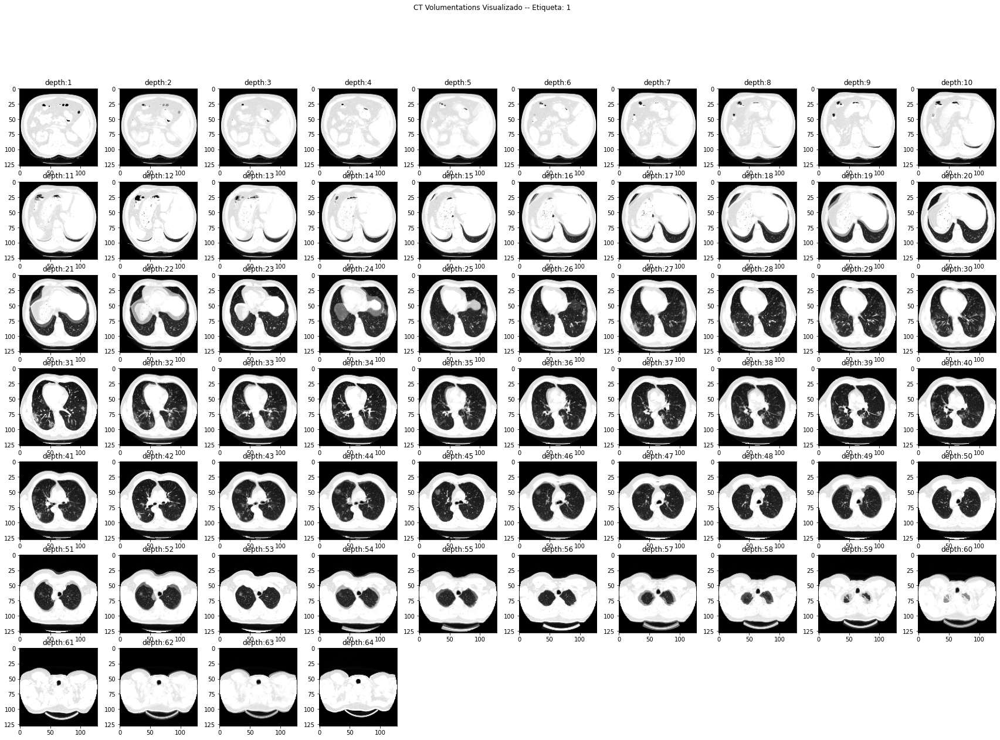

In [24]:
# Tomamos la imagen augmented 
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)
img_print = img_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "FlipY_AUG"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

#### 2.3 Flip Z

In [25]:
def get_augmentation(patch_size):
    return Compose([
        #Resize(patch_size, interpolation=1, resize_type=0, always_apply=True, p=1.0),
        # Rotate((-15, 15), (0, 0), (0, 0), p=1),
        #Flip(0, p=1), # Eje X
        #Flip(1, p=1), # Eje Y
        Flip(2, p=1), # Eje Z
        #GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        #ColorJitter(brightness=(1,3),contrast=(0.4,0.8),saturation=0,hue=0, p=1),
    ], p=1)

def augmentor(img):
    aug = get_augmentation((128,128,64))
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    return np.ndarray.astype(img , np.float32)



Pre Shape: (128, 128, 64)
Post Shape: (128, 128, 64)
Label: 1
---- Orignal
Min: -2.0478394e-16
Max: 1.0
Mean: 0.5099596
Sum: 534731.4
---- Aumentada
Min: -2.0478394e-16
Max: 1.0
Mean: 0.5099596
Sum: 534731.4
------------------------------------------- Cambió: False


Text(0.5, 1.0, 'Después')

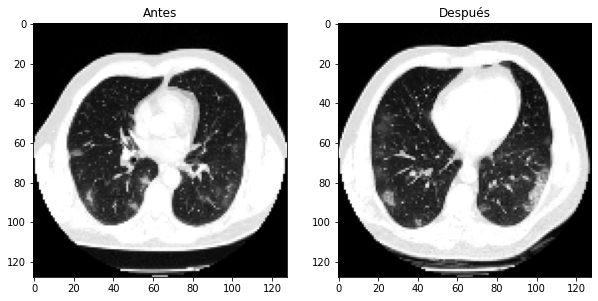

In [26]:
imagen_pre_aug = imagen
label = archivo.loc[0,'Label']
img_aug = augmentor(imagen_pre_aug)

print("Pre Shape:",imagen_pre_aug.shape)
print("Post Shape:",img_aug.shape)
print("Label:",label)

print("---- Orignal")
print("Min:", imagen_pre_aug.min())
print("Max:", imagen_pre_aug.max())
print("Mean:", imagen_pre_aug.mean())
print("Sum:", imagen_pre_aug.sum())

print("---- Aumentada")
print("Min:", img_aug.min())
print("Max:", img_aug.max())
print("Mean:", img_aug.mean())
print("Sum:", img_aug.sum())

print(f"------------------------------------------- Cambió: {imagen_pre_aug.sum() != img_aug.sum()}")

# Ploteamos un slice antes y después
fig = plt.figure(figsize=(10, 10))
rows = 1
columns = 2

slice = 35
fig.add_subplot(rows, columns, 1)
plt.imshow(np.squeeze(imagen_pre_aug[:, :, slice]), cmap="gray")
plt.title("Antes")

fig.add_subplot(rows, columns, 2)
plt.imshow(np.squeeze(img_aug[:, :, slice]), cmap="gray")
plt.title("Después")

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_FlipZ_ORI_study_0969_Label_1_Rango-1000_0.png


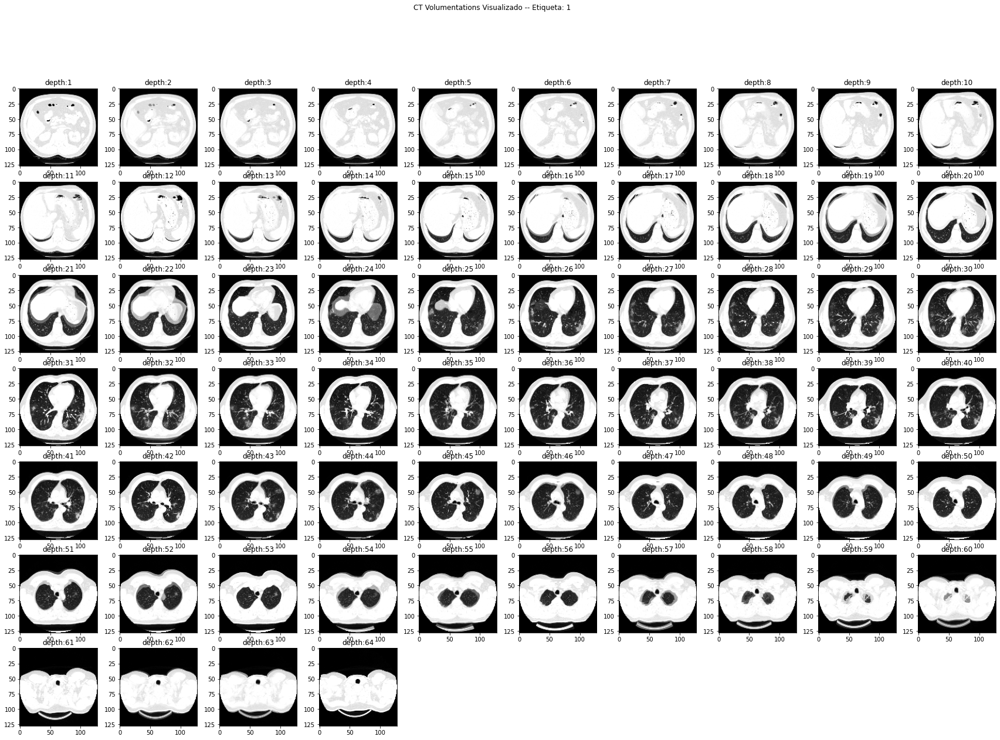

In [27]:
# Tomamos la imagen original
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)

img_print = imagen_pre_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
#img_print = img_test
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "FlipZ_ORI"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_FlipZ_AUG_study_0969_Label_1_Rango-1000_0.png


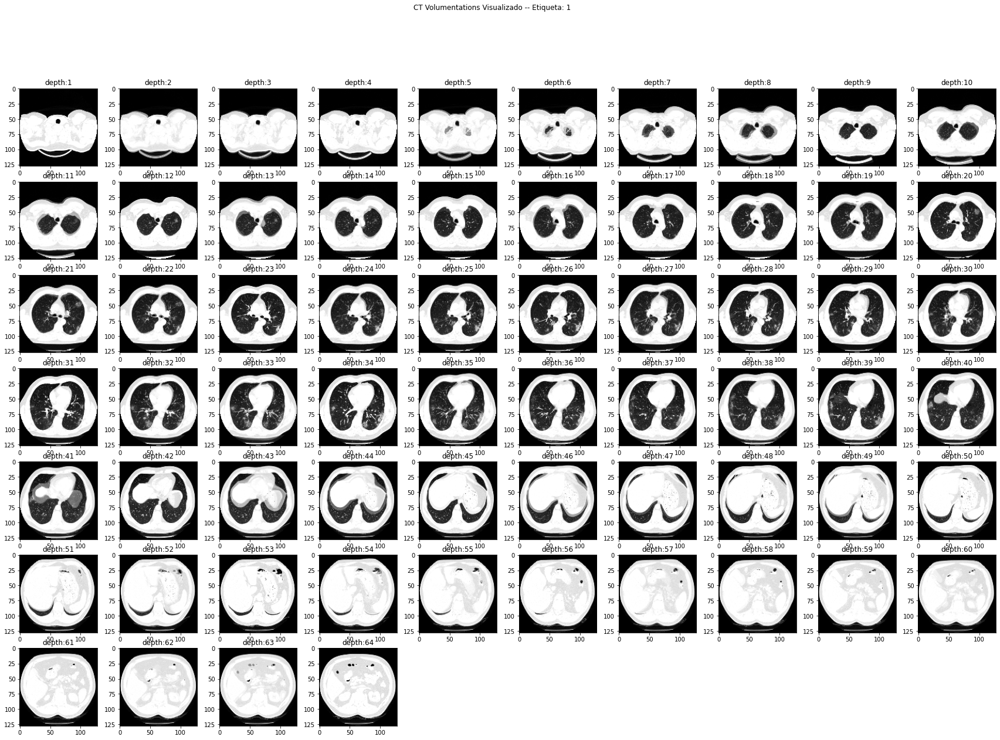

In [28]:
# Tomamos la imagen augmented 
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)
img_print = img_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "FlipZ_AUG"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

#### 2.4 Ruido Gaussiano

In [29]:
def get_augmentation(patch_size):
    return Compose([
        #Resize(patch_size, interpolation=1, resize_type=0, always_apply=True, p=1.0),
        # Rotate((-15, 15), (0, 0), (0, 0), p=1),
        # Flip(0, p=1), # Eje X
        # Flip(1, p=1), # Eje Y
        # Flip(2, p=1), # Eje Z
        GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        #ColorJitter(brightness=(1,3),contrast=(0.4,0.8),saturation=0,hue=0, p=1),
    ], p=1)

def augmentor(img):
    aug = get_augmentation((128,128,64))
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    return np.ndarray.astype(img , np.float32)



Pre Shape: (128, 128, 64)
Post Shape: (128, 128, 64)
Label: 1
---- Orignal
Min: -2.0478394e-16
Max: 1.0
Mean: 0.5099596
Sum: 534731.4
---- Aumentada
Min: -0.09011005
Max: 1.0819852
Mean: 0.50999177
Sum: 534765.1
------------------------------------------- Cambió: True


Text(0.5, 1.0, 'Después')

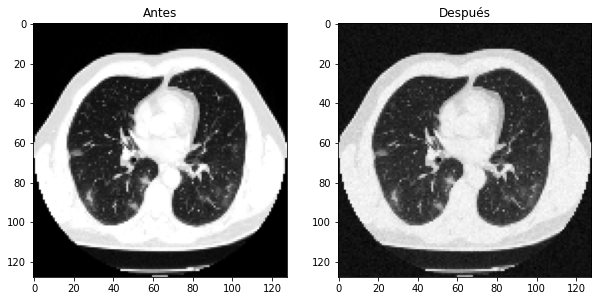

In [30]:
imagen_pre_aug = imagen
label = archivo.loc[0,'Label']
img_aug = augmentor(imagen_pre_aug)

print("Pre Shape:",imagen_pre_aug.shape)
print("Post Shape:",img_aug.shape)
print("Label:",label)

print("---- Orignal")
print("Min:", imagen_pre_aug.min())
print("Max:", imagen_pre_aug.max())
print("Mean:", imagen_pre_aug.mean())
print("Sum:", imagen_pre_aug.sum())

print("---- Aumentada")
print("Min:", img_aug.min())
print("Max:", img_aug.max())
print("Mean:", img_aug.mean())
print("Sum:", img_aug.sum())

print(f"------------------------------------------- Cambió: {imagen_pre_aug.sum() != img_aug.sum()}")

# Ploteamos un slice antes y después
fig = plt.figure(figsize=(10, 10))
rows = 1
columns = 2

slice = 35
fig.add_subplot(rows, columns, 1)
plt.imshow(np.squeeze(imagen_pre_aug[:, :, slice]), cmap="gray")
plt.title("Antes")

fig.add_subplot(rows, columns, 2)
plt.imshow(np.squeeze(img_aug[:, :, slice]), cmap="gray")
plt.title("Después")

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_Gauss_ORI_study_0969_Label_1_Rango-1000_0.png


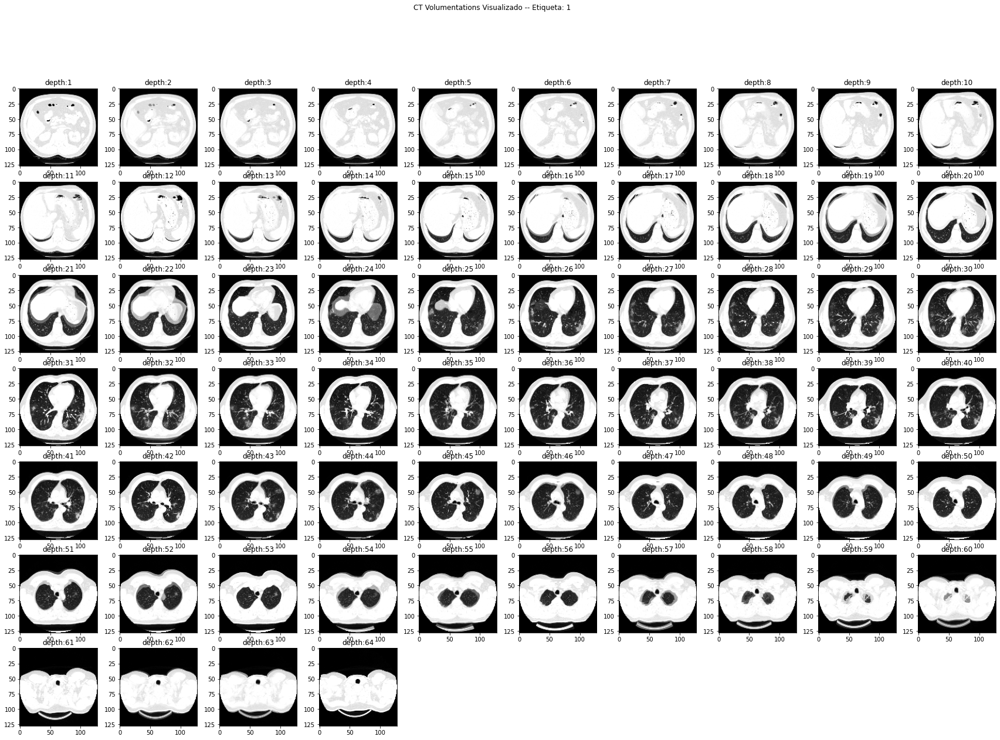

In [31]:
# Tomamos la imagen original
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)

img_print = imagen_pre_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
#img_print = img_test
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "Gauss_ORI"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_Gauss_AUG_study_0969_Label_1_Rango-1000_0.png


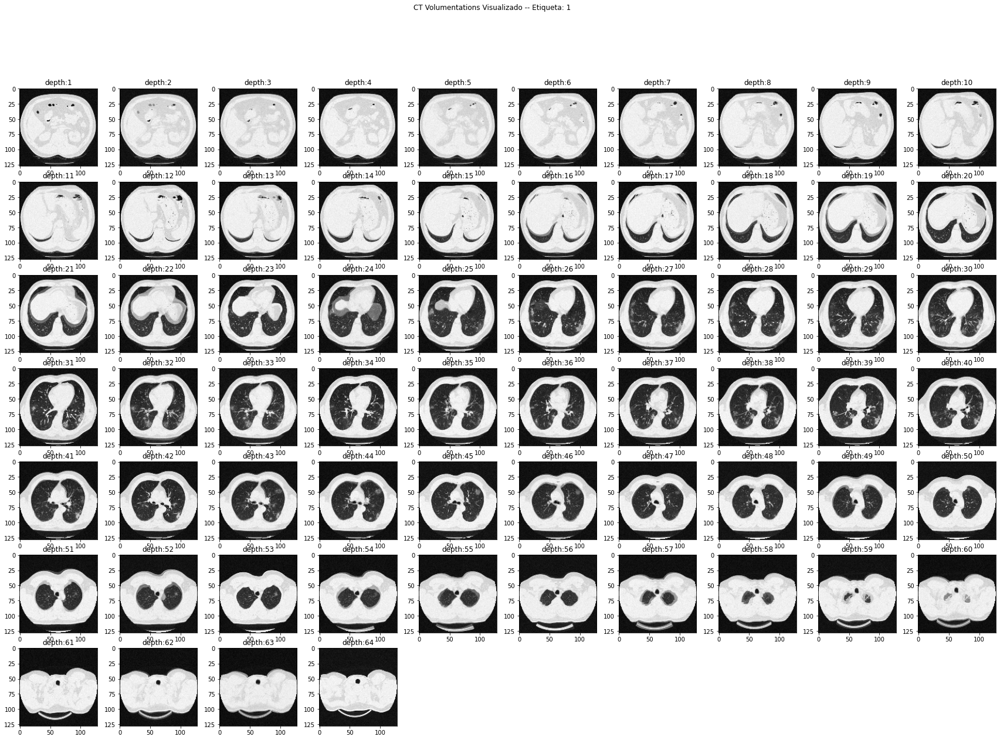

In [32]:
# Tomamos la imagen augmented 
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)
img_print = img_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "Gauss_AUG"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

#### 2.5 Color Jitter

In [33]:
def get_augmentation(patch_size):
    return Compose([
        #Resize(patch_size, interpolation=1, resize_type=0, always_apply=True, p=1.0),
        # Rotate((-15, 15), (0, 0), (0, 0), p=1),
        # Flip(0, p=1), # Eje X
        # Flip(1, p=1), # Eje Y
        # Flip(2, p=1), # Eje Z
        # GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        # ColorJitter(brightness=(1,3),contrast=(0.4,0.8),saturation=0,hue=0, p=1),
        ColorJitter(brightness=(2.9,3.1),saturation=0,hue=0, p=1), # No siempre se aplica
    ], p=1)

def augmentor(img):
    aug = get_augmentation((128,128,64))
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    return np.ndarray.astype(img , np.float32)



Pre Shape: (128, 128, 64)
Post Shape: (128, 128, 64)
Label: 1
---- Orignal
Min: -2.0478394e-16
Max: 1.0
Mean: 0.5099596
Sum: 534731.4
---- Aumentada
Min: -2.0478394e-16
Max: 1.0
Mean: 0.5099596
Sum: 534731.4
------------------------------------------- Cambió: False


Text(0.5, 1.0, 'Después')

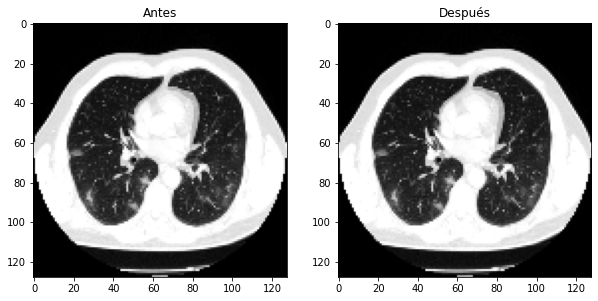

In [34]:
imagen_pre_aug = imagen
label = archivo.loc[0,'Label']
img_aug = augmentor(imagen_pre_aug)

print("Pre Shape:",imagen_pre_aug.shape)
print("Post Shape:",img_aug.shape)
print("Label:",label)

print("---- Orignal")
print("Min:", imagen_pre_aug.min())
print("Max:", imagen_pre_aug.max())
print("Mean:", imagen_pre_aug.mean())
print("Sum:", imagen_pre_aug.sum())

print("---- Aumentada")
print("Min:", img_aug.min())
print("Max:", img_aug.max())
print("Mean:", img_aug.mean())
print("Sum:", img_aug.sum())

print(f"------------------------------------------- Cambió: {imagen_pre_aug.sum() != img_aug.sum()}")

# Ploteamos un slice antes y después
fig = plt.figure(figsize=(10, 10))
rows = 1
columns = 2

slice = 35
fig.add_subplot(rows, columns, 1)
plt.imshow(np.squeeze(imagen_pre_aug[:, :, slice]), cmap="gray")
plt.title("Antes")

fig.add_subplot(rows, columns, 2)
plt.imshow(np.squeeze(img_aug[:, :, slice]), cmap="gray")
plt.title("Después")

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_Gauss_ORI_study_0969_Label_1_Rango-1000_0.png


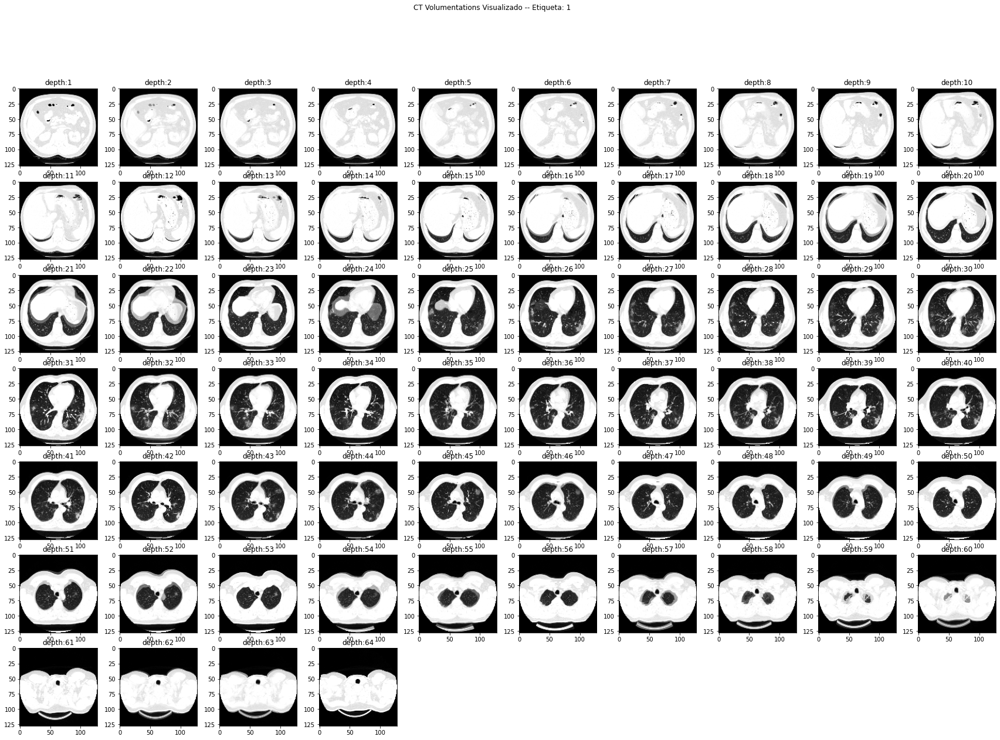

In [35]:
# Tomamos la imagen original
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)

img_print = imagen_pre_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
#img_print = img_test
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "Gauss_ORI"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

CT Volumentations Visualizado -- Etiqueta: 1
Dim: (128, 128, 64)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_Gauss_AUG_study_0969_Label_1_Rango-1000_0.png


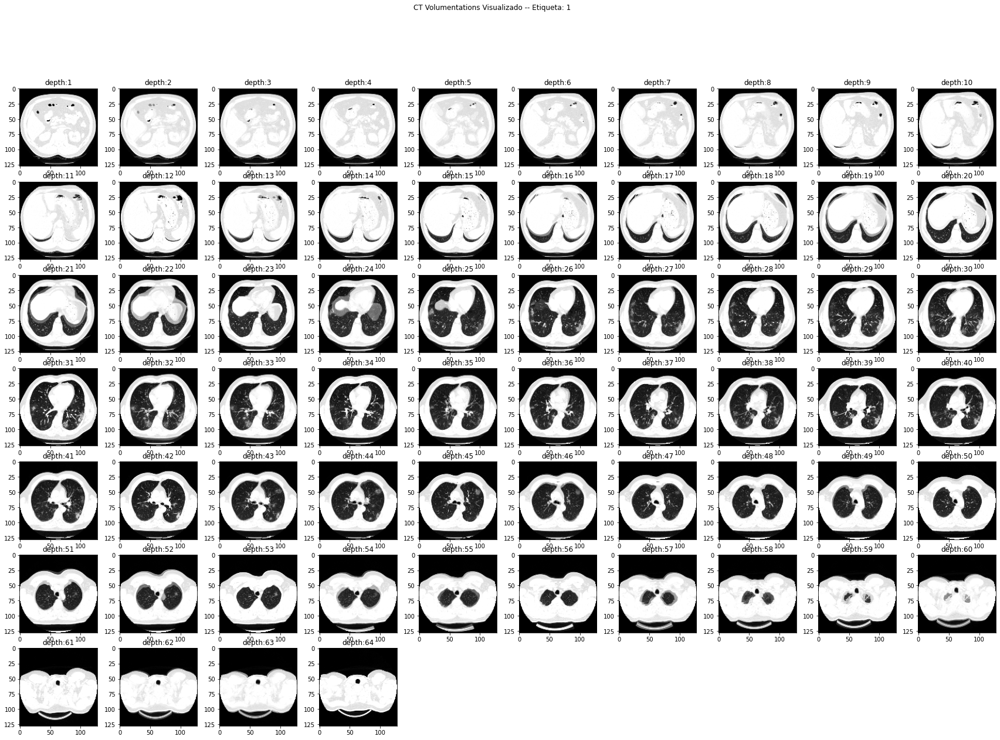

In [36]:
# Tomamos la imagen augmented 
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label}"
print(mensaje)
img_print = img_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = re.findall(r'study_[\d]+', archivo.loc[0,'File_Path'])[0]
type_image = "Gauss_AUG"

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Pruebas_Volu_{type_image}_{file_image_path}_Label_{label}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()